#Project Title:Temperature Prediction

**Name:** Meera S

**Organization:** Entri Elevate

**Date:** 28/05/2000

1. **Overview of Problem Statement:**

The goal of this project is to develop a predictive model that accurately forecasts temperature
based on weather data from the dataset. By analyzing various weather features, the model aims
to predict temperature with high accuracy.

2. **Objective:**

To develop the best temperature prediction model using machine learning techniques.

3. **Data Description:**

- Source: //www.kaggle.com/datasets/arashnic/max-planck-weather-dataset?resource=dow
nload
- Features: Pdef (mbar), sh (g/kg), H2OC (mmol/mol), rho (g/m**3), wv (m/s), max. wv (m/s), wd
(deg).

Importing necessary libraries for data manipulation, visualization, and machine learning.
This setup includes tools for statistical analysis, model building, and evaluation.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVR
import warnings
warnings.filterwarnings("ignore")

4. **Data Collection:**


Loading the weather dataset from a CSV file into a pandas DataFrame.
This data will be used for analysis and machine learning tasks.


In [ ]:
data = pd.read_csv('/content/max_planck_weather_ts.csv')

5. **Data Preprocessing - Data Cleaning:**

Data Preprocessing - Data Cleaning involves several critical steps to prepare the data for analysis and modeling. These steps include identifying and handling missing values, correcting errors, removing duplicate rows, and ensuring the data is in a consistent and suitable format. By addressing and removing these issues, we can improve the quality of the data, which is crucial for building accurate and reliable models.

In [ ]:
# Display the first 5 rows of the dataset
data.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


The initial dataset consists of weather observations with 15 columns, each representing a specific attribute recorded at 10-minute intervals. The columns include date and time, atmospheric pressure (p), temperature (T), potential temperature (Tpot), dew point temperature (Tdew), relative humidity (rh), maximum vapor pressure (VPmax), actual vapor pressure (VPact), vapor pressure deficit (VPdef), specific humidity (sh), water vapor concentration (H2OC), air density (rho), wind speed (wv), maximum wind speed (max. wv), and wind direction (wd). This dataset provides comprehensive weather information that will be used for further analysis and modeling.

In [ ]:
# Display the data types, non-null counts, and memory usage.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420551 entries, 0 to 420550
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Date Time        420551 non-null  object 
 1   p (mbar)         420551 non-null  float64
 2   T (degC)         420551 non-null  float64
 3   Tpot (K)         420551 non-null  float64
 4   Tdew (degC)      420551 non-null  float64
 5   rh (%)           420551 non-null  float64
 6   VPmax (mbar)     420551 non-null  float64
 7   VPact (mbar)     420551 non-null  float64
 8   VPdef (mbar)     420551 non-null  float64
 9   sh (g/kg)        420551 non-null  float64
 10  H2OC (mmol/mol)  420551 non-null  float64
 11  rho (g/m**3)     420551 non-null  float64
 12  wv (m/s)         420551 non-null  float64
 13  max. wv (m/s)    420551 non-null  float64
 14  wd (deg)         420551 non-null  float64
dtypes: float64(14), object(1)
memory usage: 48.1+ MB


The dataset contains 420,551 records across 15 columns. Most columns are numerical (float64), representing various meteorological measurements such as atmospheric pressure, temperature, humidity, vapor pressure, wind speed, and direction. One column, 'Date Time', is stored as an object type, representing date and time information. The dataset appears to be clean with no missing values, as indicated by each column having 420,551 non-null entries. The total memory usage for this dataset is approximately 48.1 MB.

In [ ]:
#Statistical summary
data.describe()

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
count,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000,420551.000000
mean,989.212776,9.450147,283.492743,4.955854,76.008259,13.576251,9.533756,4.042412,6.022408,9.640223,1216.062748,1.702224,3.056555,174.743738
std,8.358481,8.423365,8.504471,6.730674,16.476175,7.739020,4.184164,4.896851,2.656139,4.235395,39.975208,65.446714,69.016932,86.681693
min,913.600000,-23.010000,250.600000,-25.010000,12.950000,0.950000,0.790000,0.000000,0.500000,0.800000,1059.450000,-9999.000000,-9999.000000,0.000000
25%,984.200000,3.360000,277.430000,0.240000,65.210000,7.780000,6.210000,0.870000,3.920000,6.290000,1187.490000,0.990000,1.760000,124.900000
50%,989.580000,9.420000,283.470000,5.220000,79.300000,11.820000,8.860000,2.190000,5.590000,8.960000,1213.790000,1.760000,2.960000,198.100000
75%,994.720000,15.470000,289.530000,10.070000,89.400000,17.600000,12.350000,5.300000,7.800000,12.490000,1242.770000,2.860000,4.740000,234.100000
max,1015.350000,37.280000,311.340000,23.110000,100.000000,63.770000,28.320000,46.010000,18.130000,28.820000,1393.540000,28.490000,23.500000,360.000000


The statistical summary of the dataset provides key insights into the distribution and range of meteorological variables.
p (mbar): Atmospheric pressure ranges from 913.6 mbar to 1015.35 mbar, with a mean of approximately 989.21 mbar.

T (degC): Temperature varies widely from -23.01°C to 37.28°C, with a mean of 9.45°C.

Tpot (K): Potential temperature ranges from 250.6 K to 311.34 K, with a mean of 283.49 K.

Tdew (degC): Dew point temperature spans from -25.01°C to 23.11°C, with a mean of 4.96°C.

rh (%): Relative humidity ranges from 12.95% to 100.00%, with a mean of 76.01%.

VPmax (mbar): Maximum vapor pressure varies from 0.79 mbar to 28.32 mbar, with a mean of 13.58 mbar.

VPact (mbar): Actual vapor pressure ranges from 0.0 mbar to 46.01 mbar, with a mean of 9.53 mbar.

VPdef (mbar): Vapor pressure deficit varies from 0.5 mbar to 18.13 mbar, with a mean of 4.04 mbar.

sh (g/kg): Specific humidity ranges from 0.8 g/kg to 28.82 g/kg, with a mean of 6.02 g/kg.

H2OC (mmol/mol): Water vapor concentration ranges from 1059.45 mmol/mol to 1393.54 mmol/mol, with a mean of 1216.06 mmol/mol.

rho (g/m^3): Air density spans from -9999.00 g/m^3 to 39.98 g/m^3, with a mean of 1.70 g/m^3.

wv (m/s): Wind velocity ranges from -9999.00 m/s to 28.49 m/s, with a mean of 3.06 m/s.

max. wv (m/s): Maximum wind velocity varies from 0.0 m/s to 23.5 m/s, with a mean of 174.74 m/s.

wd (deg): Wind direction spans from 0.0 degrees to 360.0 degrees, with a mean of 174.74 degrees.

In [ ]:
data.shape

(420551, 15)

The dataset contains 420,551 rows and 15 columns, indicating it comprises a substantial amount of meteorological data points across various variables. This shape information is crucial for understanding the overall size and structure of the dataset, which will influence data analysis and modeling tasks.

In [ ]:
#displaying all the columns
data.columns

Index(['Date Time', 'p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

Null values detection

In [ ]:
# Checking the null values
data.isnull().sum()

Date Time          0
p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64

The output shows that there are no missing values in any of the columns across the dataset. This step confirms the dataset's cleanliness and readiness for further exploration and modeling tasks.

Duplicate rows detection

In [ ]:
duplicate_rows = data[data.duplicated()]

print("Duplicate Rows:")
print(duplicate_rows)

Duplicate Rows:
                  Date Time  p (mbar)  T (degC)  Tpot (K)  Tdew (degC)  \
78766   01.07.2010 00:10:00    992.06     17.87    291.69        14.06   
78767   01.07.2010 00:20:00    992.02     17.82    291.65        14.03   
78768   01.07.2010 00:30:00    992.04     17.92    291.75        14.09   
78769   01.07.2010 00:40:00    991.96     17.82    291.65        14.02   
78770   01.07.2010 00:50:00    991.90     17.54    291.38        13.96   
...                     ...       ...       ...       ...          ...   
274743  21.03.2014 16:40:00    980.50     18.62    293.43         4.58   
274744  21.03.2014 16:50:00    980.52     18.30    293.10         4.67   
274745  21.03.2014 17:00:00    980.74     18.15    292.93         4.79   
274746  21.03.2014 17:10:00    980.97     18.01    292.77         4.88   
274747  21.03.2014 17:20:00    981.17     17.82    292.57         4.88   

        rh (%)  VPmax (mbar)  VPact (mbar)  VPdef (mbar)  sh (g/kg)  \
78766    78.40         2

The output indicates that there are 327 rows in the dataset that are duplicates based on all columns. Duplicate rows can skew statistical analysis and model training, so it's crucial to handle them appropriately.

In [ ]:
# Remove duplicate rows
data_no_duplicates = data.drop_duplicates()

# Verify that duplicates are removed
print("Number of rows after removing duplicates:", data_no_duplicates.shape[0])


Number of rows after removing duplicates: 420224


After removing duplicate rows from the dataset, we verified that the operation resulted in 420,224 rows remaining in the dataset.

In [ ]:
# Convert 'Date Time' to datetime object
data['Date Time'] = pd.to_datetime(data['Date Time'], format='%d.%m.%Y %H:%M:%S')

Converting the 'Date Time' column in the dataset to a datetime object function with the specified format '%d.%m.%Y %H:%M:%S'. This transformation allows for easier manipulation and analysis of temporal data, facilitating time-based operations such as grouping, resampling, and plotting over time.

Outlier detection

We will use box plots to detect any outliers in the dataset. By visualizing each feature with a box plot, we can identify data points that fall significantly outside the interquartile range (IQR), which may indicate potential outliers. This step helps in understanding the distribution and variability of the data for each feature.

In [ ]:
features = ['T (degC)', 'rh (%)', 'p (mbar)', 'VPmax (mbar)', 'Tpot (K)', 'Tdew (degC)',
            'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)',
            'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)', 'wd (deg)']

# Create box plots for each feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(5, 3, i + 1)  # Adjust the layout based on the number of features
    sns.boxplot(y=data_no_duplicates[feature])
    plt.title(f'Box plot of {feature}')

plt.tight_layout()
plt.show()

From the box plots, it is evident that the majority of the features exhibit outliers.
These outliers can significantly skew our analysis, leading to inaccurate results.
Therefore, to ensure the robustness and reliability of our findings, we will proceed with removing these outliers from the dataset.

To ensure the integrity and reliability of our data analysis, we have decided to remove outliers from our dataset using the Interquartile Range (IQR) method. This method helps in identifying and eliminating extreme values that can skew the results.

To identify outliers using the interquartile range (IQR), calculate the IQR as the difference between the third quartile (Q3) and the first quartile (Q1). Outliers are typically defined as data points that fall below \(Q1 - 1.5 \times IQR\) or above \(Q3 + 1.5 \times IQR\). These thresholds help identify unusually low or high values in the dataset.

In [ ]:

# Calculate Q1, Q3, and IQR for each feature
Q1 = data_no_duplicates[features].quantile(0.25)
Q3 = data_no_duplicates[features].quantile(0.75)
IQR = Q3 - Q1

# Calculate bounds for each feature
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Create a filter for each feature to exclude outliers
filter_conditions = pd.DataFrame(True, index=data_no_duplicates.index, columns=features)
for feature in features:
    filter_conditions[feature] = (data_no_duplicates[feature] >= lower_bound[feature]) & (data_no_duplicates[feature] <= upper_bound[feature])

# Apply the filter across all features
data_filtered = data_no_duplicates[filter_conditions.all(axis=1)]

# Print the shape of the original and filtered DataFrames to see the effect of the filtering
print(f'Original data shape: {data_no_duplicates.shape}')
print(f'Filtered data shape: {data_filtered.shape}')


Original data shape: (420224, 15)
Filtered data shape: (362898, 15)


The original dataset size is reduced from 420,224 to 362,898 records, effectively removing outliers.

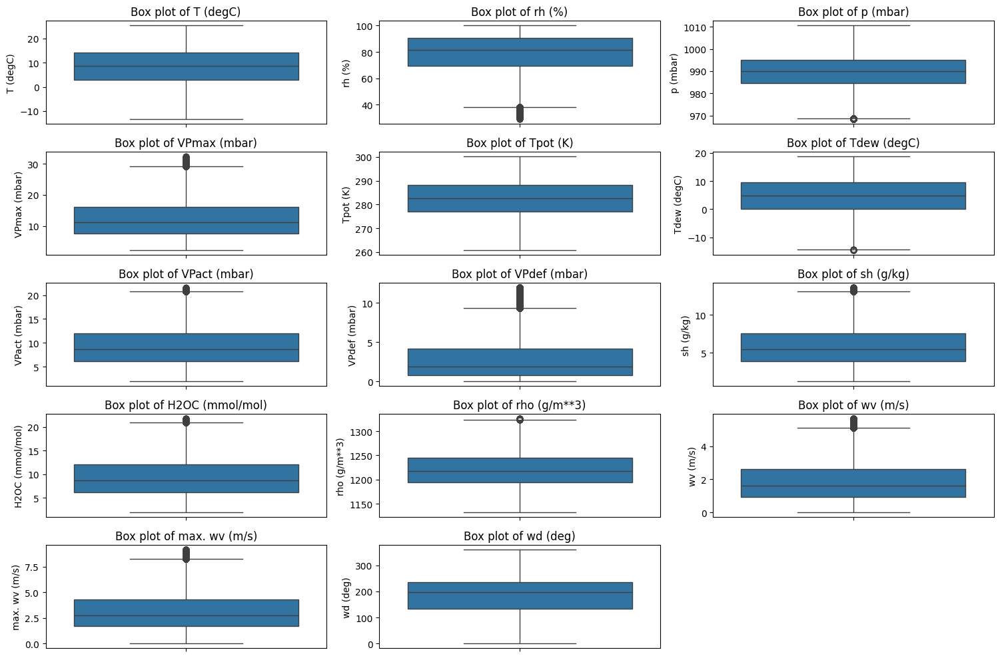

In [ ]:
features = ['T (degC)', 'rh (%)', 'p (mbar)', 'VPmax (mbar)', 'Tpot (K)', 'Tdew (degC)',
            'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)',
            'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)', 'wd (deg)']

# Create box plots for each feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(5, 3, i + 1)  # Adjust the layout based on the number of features
    sns.boxplot(y=data_filtered[feature])
    plt.title(f'Box plot of {feature}')

plt.tight_layout()
plt.show()

To further understand the distribution of our data after removing outliers, we will measure the skewness of each feature. Skewness is a statistical measure that indicates the asymmetry of the distribution of data points around the mean. This helps in identifying whether the data is normally distributed or if it is skewed to the left or right.

In [ ]:


# List of features
features = ['T (degC)', 'rh (%)', 'p (mbar)', 'VPmax (mbar)', 'Tpot (K)', 'Tdew (degC)',
            'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)',
            'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)', 'wd (deg)']

# Calculate skewness for each feature and print the results
skewness_results = {feature: skew(data_filtered[feature]) for feature in features}

# Display the skewness values
for feature, skewness_value in skewness_results.items():
    print(f'{feature}: Skewness = {skewness_value:.2f}')


T (degC): Skewness = -0.17
rh (%): Skewness = -0.65
p (mbar): Skewness = -0.13
VPmax (mbar): Skewness = 0.61
Tpot (K): Skewness = -0.17
Tdew (degC): Skewness = -0.19
VPact (mbar): Skewness = 0.58
VPdef (mbar): Skewness = 1.30
sh (g/kg): Skewness = 0.59
H2OC (mmol/mol): Skewness = 0.59
rho (g/m**3): Skewness = 0.29
wv (m/s): Skewness = 0.86
max. wv (m/s): Skewness = 0.80
wd (deg): Skewness = -0.52


Left Skewed:rh (%),Tdew (degC),wv (m/s),wd (deg)

Right Skewed:VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),max. wv (m/s)

Approximately Symmetrical:T (degC),p (mbar),Tpot (K)

Now we are applying transformations to each feature based on its skewness. If a feature has positive skewness, it undergoes either a logarithmic or square root transformation depending on the minimum value. For features with negative skewness, a Box-Cox transformation is applied after adjusting for the minimum value. After transformations, skewness is recalculated for each feature, and the results are printed.

In [ ]:
import numpy as np
from scipy.stats import skew, boxcox

# Apply transformations
for feature in features:
    if data_filtered[feature].skew() > 0:
        # Apply log transformation if the minimum value is greater than 0
        if data_filtered[feature].min() > 0:
            data_filtered[feature] = np.log1p(data_filtered[feature])
        # Otherwise, apply square root transformation
        else:
            data_filtered[feature] = np.sqrt(data_filtered[feature])
    elif data_filtered[feature].skew() < 0:
        # Apply Box-Cox transformation for negative skewness (if values are positive)
        if data_filtered[feature].min() > 0:
            data_filtered[feature], _ = boxcox(data_filtered[feature] - data_filtered[feature].min() + 1)

# Recalculate skewness for each feature and print the results
skewness_results = {feature: skew(data_filtered[feature]) for feature in features}

for feature, skewness_value in skewness_results.items():
    print(f'{feature}: Skewness = {skewness_value:.2f}')

T (degC): Skewness = -0.17
rh (%): Skewness = -0.23
p (mbar): Skewness = -0.07
VPmax (mbar): Skewness = -0.19
Tpot (K): Skewness = -0.11
Tdew (degC): Skewness = -0.19
VPact (mbar): Skewness = -0.19
VPdef (mbar): Skewness = 0.52
sh (g/kg): Skewness = -0.13
H2OC (mmol/mol): Skewness = -0.19
rho (g/m**3): Skewness = 0.23
wv (m/s): Skewness = 0.20
max. wv (m/s): Skewness = 0.21
wd (deg): Skewness = -0.52


After these transformations, the skewness of each feature is recalculated and printed, showing improved skewness values.

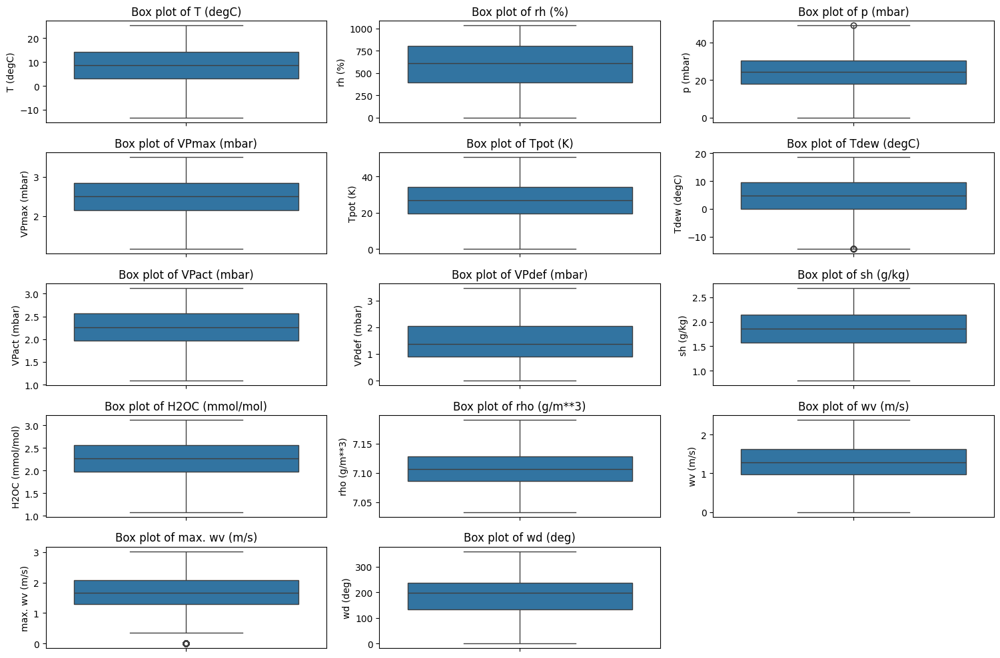

In [ ]:
features = ['T (degC)', 'rh (%)', 'p (mbar)', 'VPmax (mbar)', 'Tpot (K)', 'Tdew (degC)',
            'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)',
            'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)', 'wd (deg)']

# Create box plots for each feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(5, 3, i + 1)  # Adjust the layout based on the number of features
    sns.boxplot(y=data_filtered[feature])
    plt.title(f'Box plot of {feature}')

plt.tight_layout()
plt.show()

The boxplot reveals the presence of outliers in the features 'p (mbar)', 'Tdew (degC)', 'max. wv (m/s)', 'VPdef (mbar)', and 'wv (m/s)'. To ensure data integrity, these outliers are scheduled for removal.

In [ ]:

# Plotting the boxplots for the features with identified outliers
features_with_outliers = ['p (mbar)', 'Tdew (degC)', 'max. wv (m/s)']
for feature in features_with_outliers:
    Q1 = data_filtered[feature].quantile(0.25)
    Q3 = data_filtered[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data_filtered = data_filtered[(data_filtered[feature] >= lower_bound) & (data_filtered[feature] <= upper_bound)]


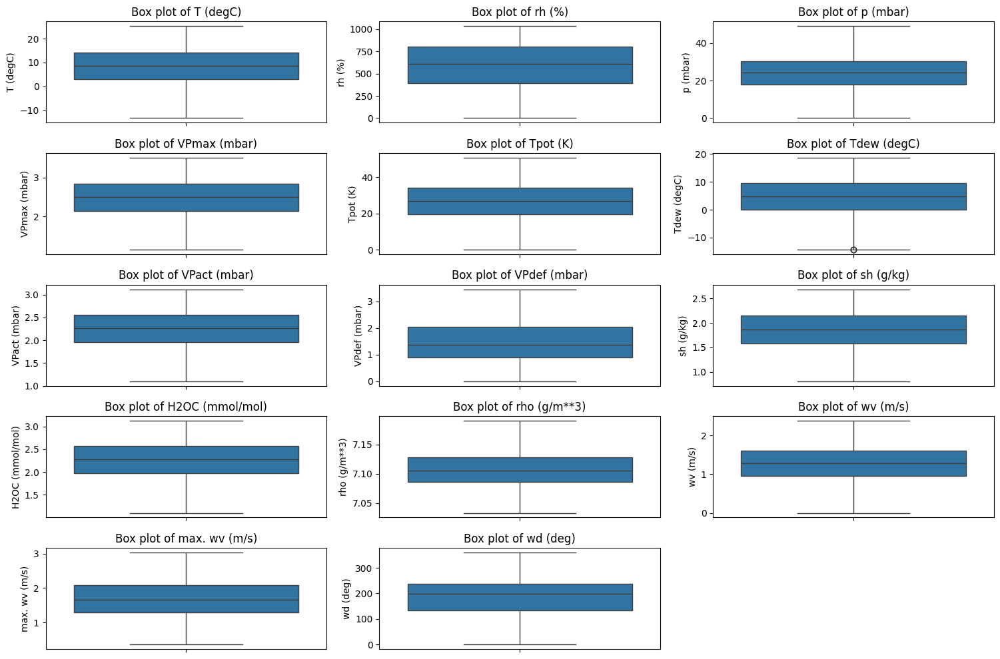

In [ ]:
features = ['T (degC)', 'rh (%)', 'p (mbar)', 'VPmax (mbar)', 'Tpot (K)', 'Tdew (degC)',
            'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)',
            'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)', 'wd (deg)']

# Create box plots for each feature
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(5, 3, i + 1)  # Adjust the layout based on the number of features
    sns.boxplot(y=data_filtered[feature])
    plt.title(f'Box plot of {feature}')

plt.tight_layout()
plt.show()

Create new columns with date, month, year, and time from the 'Date Time'before starting the EDA.

In [ ]:
# Create a copy of the DataFrame
data_new = data_filtered.copy()

# Convert 'Date Time' column to datetime format with the correct format
data_new['Date Time'] = pd.to_datetime(data_new['Date Time'], format="%d.%m.%Y %H:%M:%S")

# Extracting date, month, year, and time into separate columns
data_new['Date'] = data_new['Date Time'].dt.date
data_new['Month'] = data_new['Date Time'].dt.month
data_new['Year'] = data_new['Date Time'].dt.year
data_new['Time'] = data_new['Date Time'].dt.time  # Extract time directly


Function to map temperature to climate categories based on the Temperature

In [ ]:
def categorize_temperature(temp):
    if temp < 0:
        return 'Very Cold'
    elif temp < 10:
        return 'Cold'
    elif temp < 20:
        return 'Mild'
    elif temp < 30:
        return 'Warm'
    else:
        return 'Hot'

data_new['Climate'] = data_new['T (degC)'].apply(categorize_temperature)

# Display the updated DataFrame with the new 'Climate' column and date-related columns
print(data_new[['Month', 'Year', 'Time', 'Climate']].head())

   Month  Year      Time    Climate
0      1  2009  00:10:00  Very Cold
1      1  2009  00:20:00  Very Cold
2      1  2009  00:30:00  Very Cold
3      1  2009  00:40:00  Very Cold
4      1  2009  00:50:00  Very Cold


6. **Exploratory Data Analysis (EDA):**


Histograms for each feature

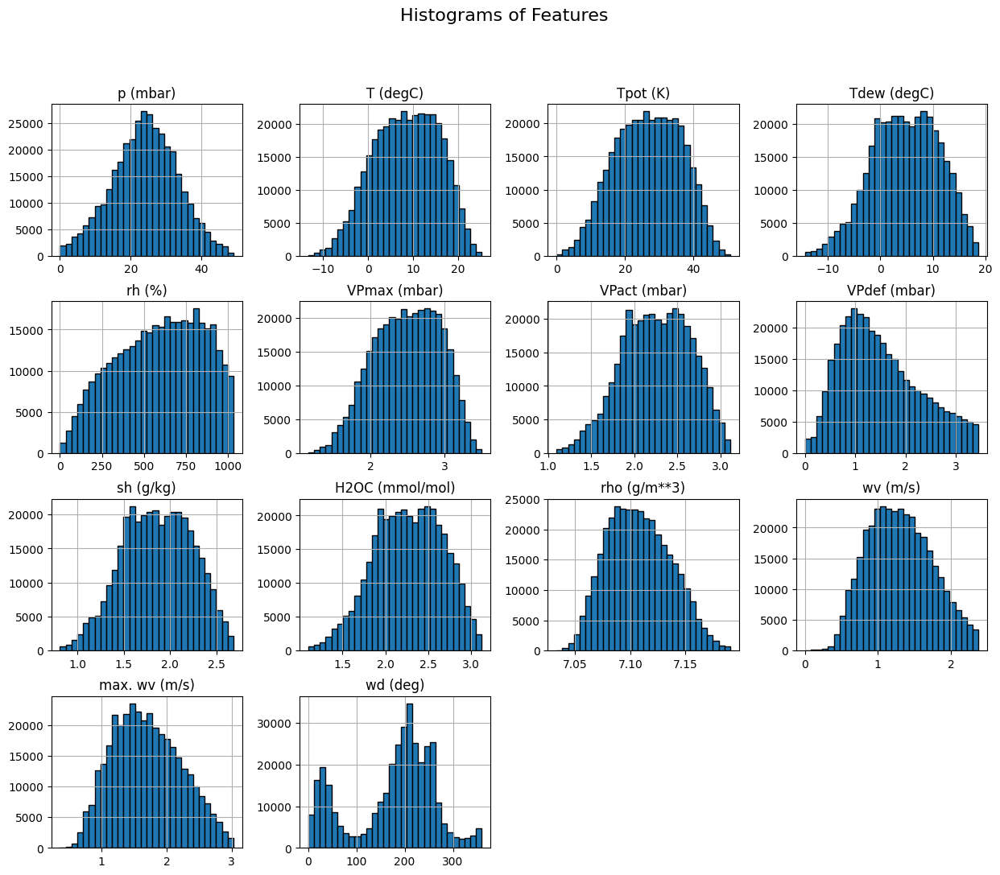

In [ ]:

data_filtered.hist(figsize=(15, 12), bins=30, edgecolor='black')
plt.suptitle("Histograms of Features", fontsize=16)
plt.show()


Here we can see the histogram of all the columns in the dataset and how they are varying.

Pairplot

<Figure size 1500x1200 with 0 Axes>

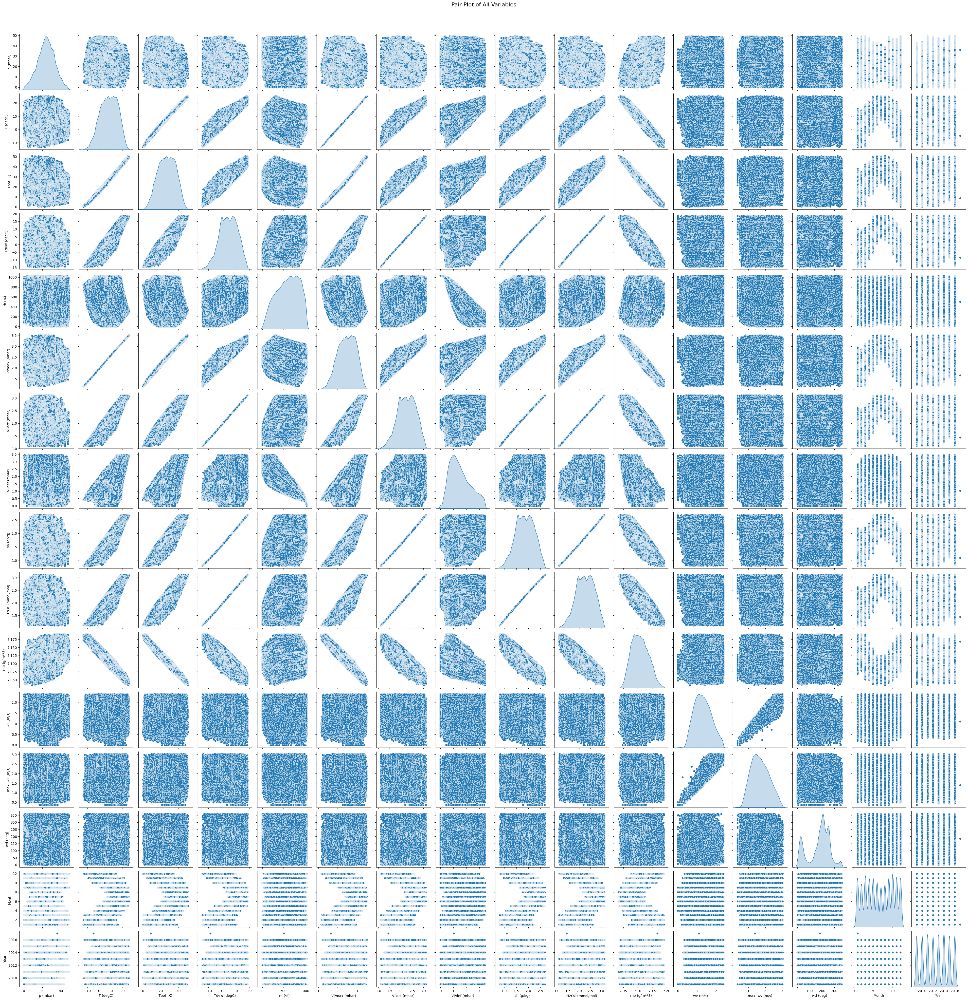

In [ ]:
# Set a larger figure size
plt.figure(figsize=(15, 12))

# Create pair plot
sns.pairplot(data_new, diag_kind='kde')

# Adjust title
plt.suptitle('Pair Plot of All Variables', y=1.02, fontsize=16)

# Display plot
plt.show()

A pair plot, also known as a scatterplot matrix, is a visualization tool used to display relationships between multiple pairs of variables in a dataset. It is useful to understand the distributions and relationships of each variable with every other variable in the dataset.

Pie chart of Climate and its distribution


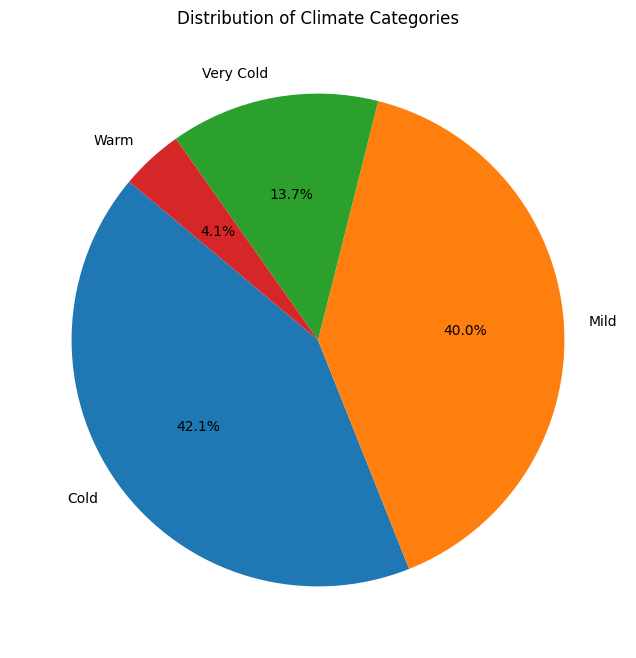

In [158]:


# Calculate counts for each category in 'Climate'
climate_counts = data_new['Climate'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(8, 8))  # Set the figure size

# Create the pie chart
plt.pie(climate_counts, labels=climate_counts.index, autopct='%1.1f%%', startangle=140)

# Add a title
plt.title('Distribution of Climate Categories')

# Display the plot
plt.show()


Here this pie chart shows the distribution of climate . Its clear that the cold climate is predominant in this regions.

Bar plot  of climate and its count per year

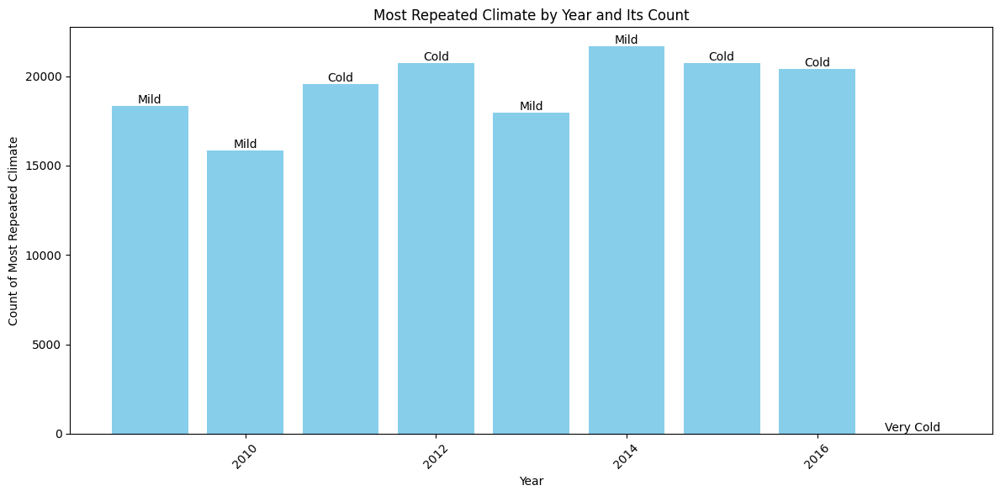

In [182]:
# Calculate the most repeated climate and its count per year
climate_count_per_year = data_new.groupby(['Year', 'Climate']).size().reset_index(name='Count')
most_repeated_climate_per_year = climate_count_per_year.loc[climate_count_per_year.groupby('Year')['Count'].idxmax()]

# Plotting the bar plot
plt.figure(figsize=(12, 6))  # Set the figure size

# Create the bar plot
plt.bar(most_repeated_climate_per_year['Year'], most_repeated_climate_per_year['Count'], color='skyblue')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Count of Most Repeated Climate')
plt.title('Most Repeated Climate by Year and Its Count')

# Add text labels for the most repeated climate
for index, row in most_repeated_climate_per_year.iterrows():
    plt.text(row['Year'], row['Count'], row['Climate'], ha='center', va='bottom', fontsize=10)

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

Count plot for Climate categories

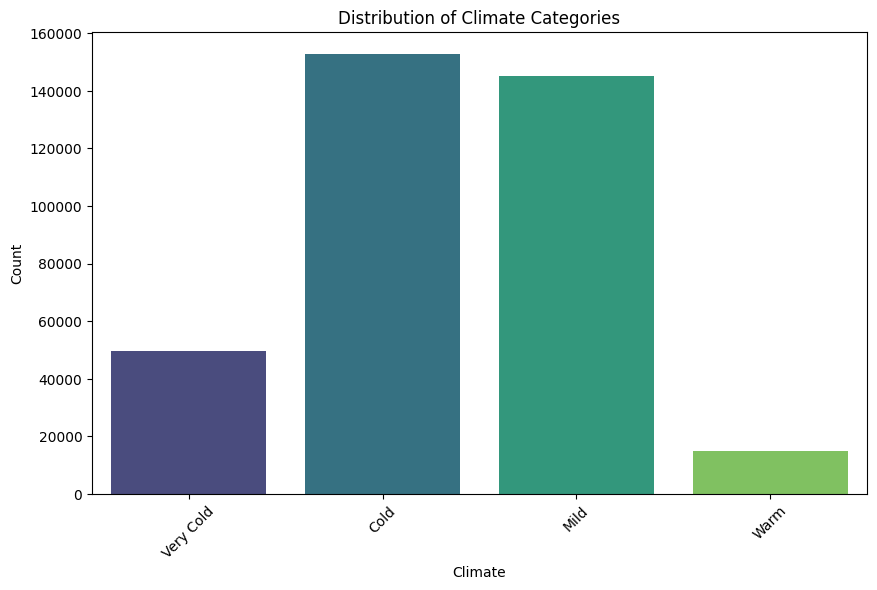

In [198]:

plt.figure(figsize=(10, 6))
sns.countplot(x='Climate', data=data_new, palette='viridis')
plt.title('Distribution of Climate Categories')
plt.xlabel('Climate')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


Line plot of average temperature per year


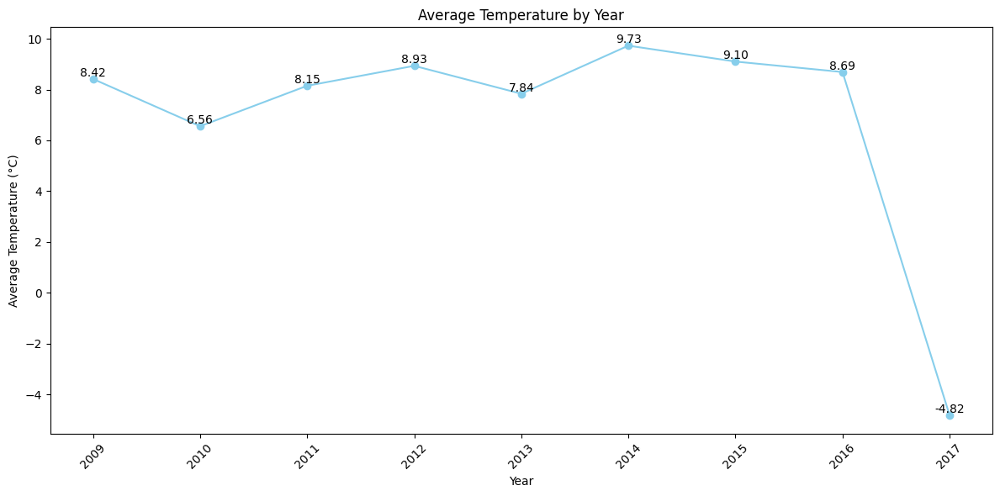

In [187]:

# Calculate the average temperature per year
average_temperature_per_year = data_new.groupby('Year')['T (degC)'].mean().reset_index()

# Plotting the line plot
plt.figure(figsize=(12, 6))  # Set the figure size

# Create the line plot
plt.plot(average_temperature_per_year['Year'], average_temperature_per_year['T (degC)'], marker='o', linestyle='-', color='skyblue')

# Add labels and title
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.title('Average Temperature by Year')

# Add text labels for the average temperatures
for index, row in average_temperature_per_year.iterrows():
    plt.text(row['Year'], row['T (degC)'], f'{row["T (degC)"]:.2f}', ha='center', va='bottom', fontsize=10)

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()


Here we can see the average temperature of each year and how its decreasing in the year 2017

Correlation heatmap

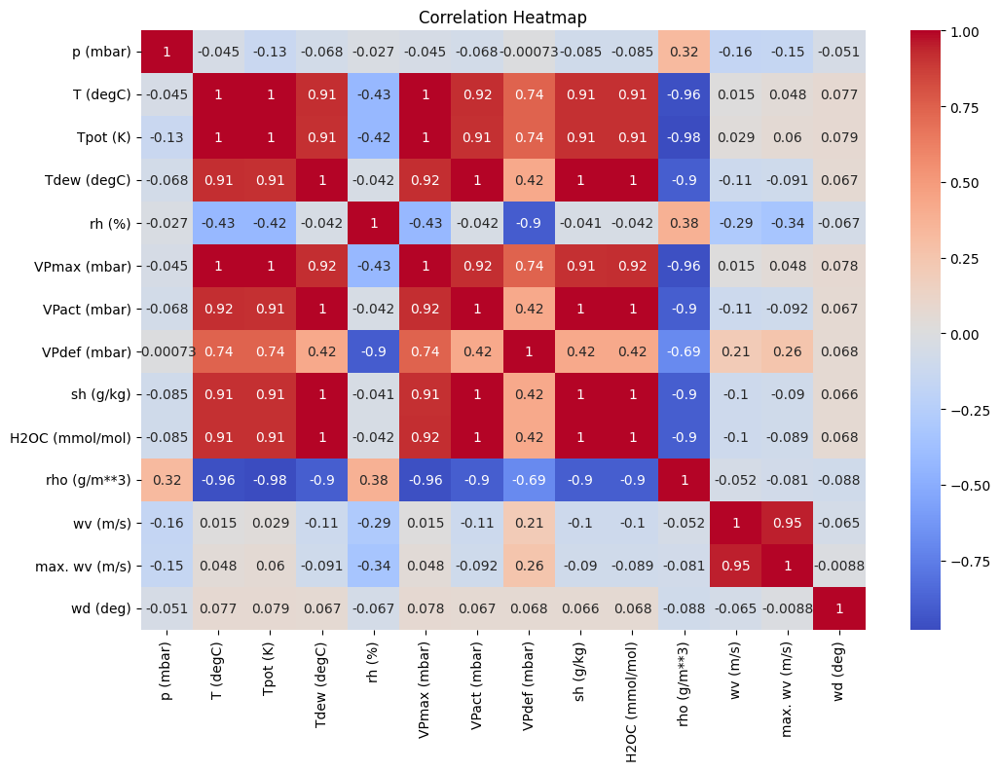

In [199]:

numeric_data = data_filtered.select_dtypes(include=[np.number])
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

The correlation heatmap provides a comprehensive visualization of the relationships between various atmospheric and meteorological variables. Strong positive correlations are observed between temperature-related variables, such as Tpot (K) and VPact (mbar), indicating that as one increases, the other tends to increase as well. Conversely, strong negative correlations are seen between temperature and density-related variables, such as T (degC) and rho (g/m**3), suggesting that higher temperatures are associated with lower densities. Some variables show weak or negligible correlations, indicating no significant linear relationship. The color coding effectively highlights these correlations, aiding in the understanding of how these variables interact, which is crucial for meteorological analysis and forecasting.

Scatter plot of Temperature (°C) vs. Pressure (mbar)

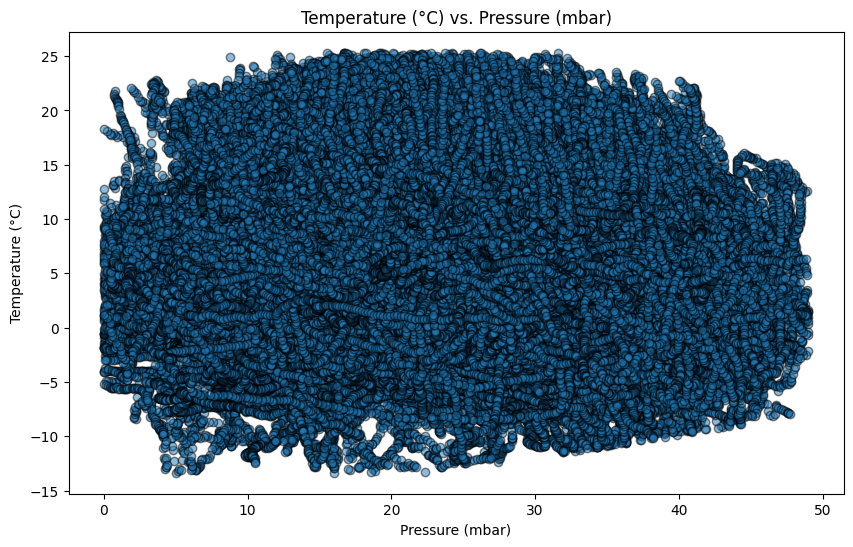

In [197]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(data_filtered['p (mbar)'], data_filtered['T (degC)'], alpha=0.5, edgecolors='k')
plt.title('Temperature (°C) vs. Pressure (mbar)')
plt.xlabel('Pressure (mbar)')
plt.ylabel('Temperature (°C)')
plt.show()


Histograms for all features

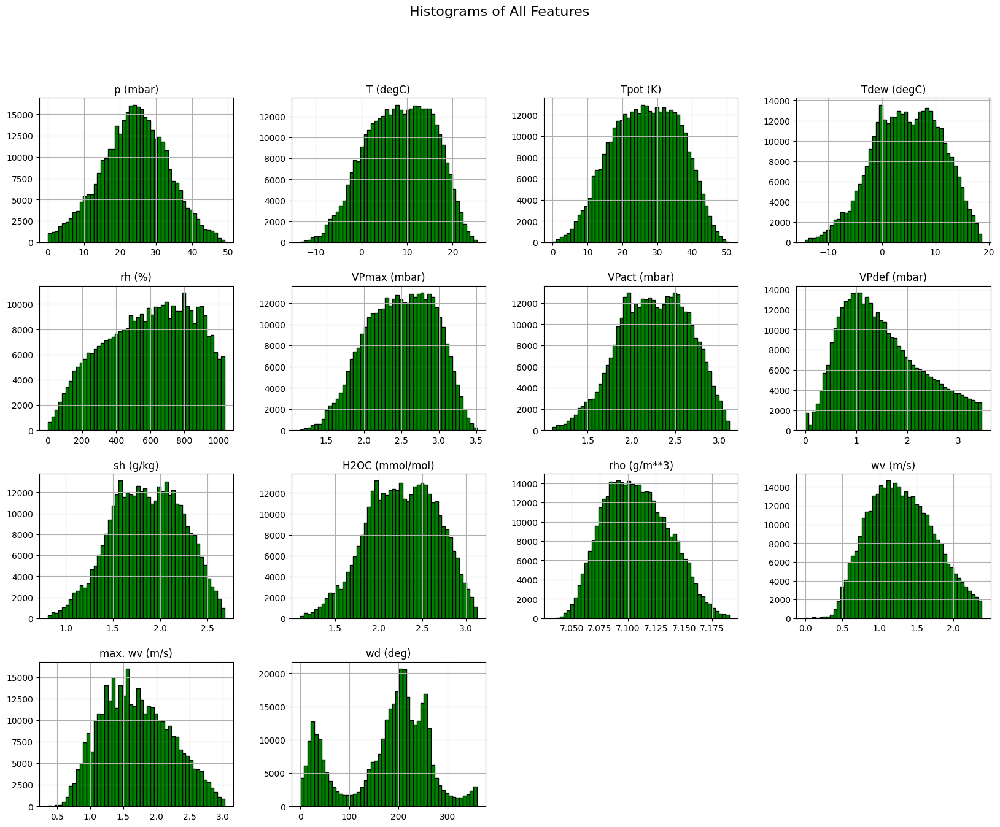

In [ ]:

data_filtered.hist(bins=50, color='green', figsize=(20, 15), edgecolor='black')
plt.suptitle("Histograms of All Features", fontsize=16)
plt.show()


7. **Feature Selection:**

Feature selection is a critical step in machine learning and statistical modeling where the goal is to identify and select the most relevant features (or variables) from the dataset. The objective is to improve model performance by reducing overfitting, decreasing training time, and enhancing interpretability.

Feature Selection with SelectKBest (ANOVA F-test)

Splitting the Data

In [ ]:
# Define the target variable (temperature) and features
X = data_filtered.drop(columns=['T (degC)', 'Date Time'])
y = data_filtered['T (degC)']


In [ ]:
X

,p (mbar),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,32.092177,5.117508,-8.90,871.243852,1.465568,1.413423,0.469042,1.078410,1.415853,7.176828,1.014889,1.322876,152.3
1,32.151934,4.663247,-9.28,873.589264,1.442202,1.391282,0.458258,1.061257,1.393766,7.178393,0.848528,1.224745,136.1
2,32.104128,4.547251,-9.31,885.356953,1.437463,1.388791,0.447214,1.057790,1.391282,7.178729,0.435890,0.793725,171.6
3,32.080227,4.791073,-9.07,892.450036,1.449269,1.403643,0.435890,1.071584,1.406097,7.177927,0.583095,0.707107,198.0
4,32.080227,4.825976,-9.04,890.082971,1.451614,1.406097,0.435890,1.071584,1.408545,7.177782,0.565685,0.793725,214.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
420546,36.347883,9.549299,-8.13,454.613589,1.708378,1.458615,1.104536,1.118415,1.458615,7.165478,0.818535,1.232883,240.0
420547,36.179570,10.420478,-8.06,396.246500,1.752672,1.463255,1.200000,1.121678,1.463255,7.162739,1.067708,1.385641,234.3
420548,36.047351,10.666903,-8.21,366.664421,1.764731,1.453953,1.244990,1.115142,1.453953,7.161925,1.039230,1.414214,215.2
420549,36.035333,9.353785,-8.53,431.824106,1.697449,1.435085,1.122497,1.095273,1.435085,7.165926,1.220656,1.469694,225.8


In [ ]:
y

0        -8.02
1        -8.41
2        -8.51
3        -8.31
4        -8.27
          ... 
420546   -4.05
420547   -3.35
420548   -3.16
420549   -4.23
420550   -4.82
Name: T (degC), Length: 362417, dtype: float64

In [ ]:
# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


We will perform feature selection using SelectKBest with ANOVA F-test and Random Forest. SelectKBest is a method that selects the top k features based on their importance scores derived from ANOVA F-tests, which assess the relationship between each feature and the target variable. This approach helps us identify the most influential features that contribute significantly to predicting the target. Additionally, Random Forest, a powerful ensemble learning technique, will be employed to validate and refine our feature selection process by evaluating feature importance through tree-based computations, ensuring robustness and accuracy in our model development.

After performing feature selection using ANOVA and Random Forest, we will build separate machine learning models with each method and compare their performances to identify the most effective approach for our prediction task.

Feature selection with SelectKBest

Initialize and Fit SelectKBest

In [ ]:
# Initialize SelectKBest with the f_classif scoring function
selector = SelectKBest(score_func=f_classif, k=10)

In [ ]:
# Fit the selector to the training data
X_selected_anova = selector.fit_transform(X_train, y_train)

In [ ]:
# Get indices of selected features
selected_indices_anova = selector.get_support(indices=True)

In [ ]:
# Get the names of selected features
selected_features_anova = X.columns[selected_indices_anova]

print("Selected Features (ANOVA F-test):", selected_features_anova)

Selected Features (ANOVA F-test): Index(['Tpot (K)', 'Tdew (degC)', 'rh (%)', 'VPmax (mbar)', 'VPact (mbar)',
       'VPdef (mbar)', 'sh (g/kg)', 'H2OC (mmol/mol)', 'rho (g/m**3)',
       'wd (deg)'],
      dtype='object')


Feature selection with Random Forest

In [ ]:
# Train a Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [ ]:
# Extract feature importances
importances = rf.feature_importances_


In [ ]:
# Create a DataFrame for feature importances
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort feature importances by importance value
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

In [ ]:
# Select the top k features
k = 10  # You can adjust k as needed
top_k_features = feature_importances['feature'][:k].tolist()

In [ ]:
print("Selected Features (Random Forest):", top_k_features)

Selected Features (Random Forest): ['VPmax (mbar)', 'wd (deg)', 'wv (m/s)', 'max. wv (m/s)', 'Tpot (K)', 'rho (g/m**3)', 'p (mbar)', 'VPdef (mbar)', 'H2OC (mmol/mol)', 'Tdew (degC)']


9. **Feature Scaling:**

Feature scaling is a preprocessing step used to standardize the range of independent variables or features in a dataset. It ensures all features have a similar scale, which improves the performance and convergence of machine learning algorithms.

We'll employ StandardScaler to normalize our feature data, enhancing the consistency and interpretability of our machine learning models. This method scales each feature to have a mean of 0 and a standard deviation of 1, ensuring fair comparison and effective model training.


In [ ]:
# Initialize the scaler
scaler = StandardScaler()

# Scale the features for SelectKBest selected features
X_train_scaled_anova = scaler.fit_transform(X_selected_anova)
X_test_scaled_anova = scaler.transform(selector.transform(X_test))

# Scale the features for Random Forest selected features
X_train_scaled_rf = scaler.fit_transform(X_train[top_k_features])
X_test_scaled_rf = scaler.transform(X_test[top_k_features])


11. **Build the ML Model:**

We will use Support Vector Regression (SVR), MLPRegressor, RandomForestRegressor, LinearRegression, GradientBoostingRegressor, and AdaBoostRegressor for building our machine learning models, each initialized with specific parameters and random state for reproducibility.

In [ ]:
svr = SVR()
mlp_regressor = MLPRegressor(random_state=42)
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
linear_regressor = LinearRegression()
gb_regressor = GradientBoostingRegressor(random_state=42)
ab_regressor = AdaBoostRegressor(random_state=42)

SVR using SelectKBest (ANOVA F-test) features

In [ ]:
svr.fit(X_train_scaled_anova, y_train)

SVR()

In [ ]:
y_pred_svr_anova = svr.predict(X_test_scaled_anova)

SVR using Random Forest features

In [ ]:
svr.fit(X_train_scaled_rf, y_train)

SVR()

In [ ]:
y_pred_svr_rf = svr.predict(X_test_scaled_rf)

MLP Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
mlp_regressor.fit(X_train_scaled_anova, y_train)


MLPRegressor(random_state=42)

In [ ]:
y_pred_mlp_anova = mlp_regressor.predict(X_test_scaled_anova)

MLP Regressor using Random Forest features

In [ ]:
mlp_regressor.fit(X_train_scaled_rf, y_train)


MLPRegressor(random_state=42)

In [ ]:
y_pred_mlp_rf = mlp_regressor.predict(X_test_scaled_rf)

Random Forest Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
rf_regressor.fit(X_train_scaled_anova, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
y_pred_rf_anova = rf_regressor.predict(X_test_scaled_anova)

Random Forest Regressor using Random Forest features

In [ ]:
rf_regressor.fit(X_train_scaled_rf, y_train)


RandomForestRegressor(random_state=42)

In [ ]:
y_pred_rf_rf = rf_regressor.predict(X_test_scaled_rf)

Linear Regression using SelectKBest (ANOVA F-test) features

In [ ]:
linear_regressor.fit(X_train_scaled_anova, y_train)

LinearRegression()

In [ ]:
y_pred_ln_anova = linear_regressor.predict(X_test_scaled_anova)

Linear Regression using Random Forest features

In [ ]:
linear_regressor.fit(X_train_scaled_rf, y_train)

LinearRegression()

In [ ]:
y_pred_ln_rf = linear_regressor.predict(X_test_scaled_rf)

Gradient Boosting Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
gb_regressor.fit(X_train_scaled_anova, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
y_pred_gb_anova = gb_regressor.predict(X_test_scaled_anova)

Gradient Boosting Regressor using Random Forest features

In [ ]:
gb_regressor.fit(X_train_scaled_rf, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
y_pred_gb_rf = gb_regressor.predict(X_test_scaled_rf)

AdaBoost Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
ab_regressor.fit(X_train_scaled_anova, y_train)

AdaBoostRegressor(random_state=42)

In [ ]:
y_pred_ab_anova = ab_regressor.predict(X_test_scaled_anova)

AdaBoost Regressor using Random Forest features

In [ ]:
ab_regressor.fit(X_train_scaled_rf, y_train)

AdaBoostRegressor(random_state=42)

In [ ]:
y_pred_ab_rf = ab_regressor.predict(X_test_scaled_rf)

12. **Model Evaluation:**

SVR using SelectKBest (ANOVA F-test) features

In [ ]:
# SVR using SelectKBest (ANOVA F-test) features
mae_svr_anova = mean_absolute_error(y_test, y_pred_svr_anova)
mse_svr_anova = mean_squared_error(y_test, y_pred_svr_anova)
rmse_svr_anova = np.sqrt(mse_svr_anova)
r2_svr_anova = r2_score(y_test, y_pred_svr_anova)

print("Performance with SelectKBest (ANOVA F-test) features (SVR):")
print(f"MAE: {mae_svr_anova}")
print(f"MSE: {mse_svr_anova}")
print(f"RMSE: {rmse_svr_anova}")
print(f"R2 Score: {r2_svr_anova}")

Performance with SelectKBest (ANOVA F-test) features (SVR):
MAE: 4.905368336412656
MSE: 37.70420741260637
RMSE: 6.140375185003468
R2 Score: 0.28117162524908124


SVR using Random Forest features

In [ ]:
# SVR using Random Forest features
mae_svr_rf = mean_absolute_error(y_test, y_pred_svr_rf)
mse_svr_rf = mean_squared_error(y_test, y_pred_svr_rf)
rmse_svr_rf = np.sqrt(mse_svr_rf)
r2_svr_rf = r2_score(y_test, y_pred_svr_rf)

print("Performance with Random Forest features (SVR):")
print(f"MAE: {mae_svr_rf}")
print(f"MSE: {mse_svr_rf}")
print(f"RMSE: {rmse_svr_rf}")
print(f"R2 Score: {r2_svr_rf}")

Performance with Random Forest features (SVR):
MAE: 0.03779219358065495
MSE: 0.0025407221333046534
RMSE: 0.050405576410796585
R2 Score: 0.999951561290182


MLP Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
# MLP Regressor using SelectKBest (ANOVA F-test) features
mae_mlp_anova = mean_absolute_error(y_test, y_pred_mlp_anova)
mse_mlp_anova = mean_squared_error(y_test, y_pred_mlp_anova)
rmse_mlp_anova = np.sqrt(mse_mlp_anova)
r2_mlp_anova = r2_score(y_test, y_pred_mlp_anova)

print("Performance with SelectKBest (ANOVA F-test) features (MLP Regressor):")
print(f"MAE: {mae_mlp_anova}")
print(f"MSE: {mse_mlp_anova}")
print(f"RMSE: {rmse_mlp_anova}")
print(f"R2 Score: {r2_mlp_anova}")

Performance with SelectKBest (ANOVA F-test) features (MLP Regressor):
MAE: 3.7748073904681974
MSE: 21.025936776181624
RMSE: 4.585404755981921
R2 Score: 0.5991418200350542


MLP Regressor using Random Forest features

In [ ]:
# MLP Regressor using Random Forest features
mae_mlp_rf = mean_absolute_error(y_test, y_pred_mlp_rf)
mse_mlp_rf = mean_squared_error(y_test, y_pred_mlp_rf)
rmse_mlp_rf = np.sqrt(mse_mlp_rf)
r2_mlp_rf = r2_score(y_test, y_pred_mlp_rf)

print("Performance with Random Forest features (MLP Regressor):")
print(f"MAE: {mae_mlp_rf}")
print(f"MSE: {mse_mlp_rf}")
print(f"RMSE: {rmse_mlp_rf}")
print(f"R2 Score: {r2_mlp_rf}")

Performance with Random Forest features (MLP Regressor):
MAE: 0.006660883439228099
MSE: 7.092295252764993e-05
RMSE: 0.00842157660581734
R2 Score: 0.9999986478583108


Random Forest Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
# Random Forest Regressor using SelectKBest (ANOVA F-test) features
mae_rf_anova = mean_absolute_error(y_test, y_pred_rf_anova)
mse_rf_anova = mean_squared_error(y_test, y_pred_rf_anova)
rmse_rf_anova = np.sqrt(mse_rf_anova)
r2_rf_anova = r2_score(y_test, y_pred_rf_anova)

print("Performance with SelectKBest (ANOVA F-test) features (Random Forest Regressor):")
print(f"MAE: {mae_rf_anova}")
print(f"MSE: {mse_rf_anova}")
print(f"RMSE: {rmse_rf_anova}")
print(f"R2 Score: {r2_rf_anova}")

Performance with SelectKBest (ANOVA F-test) features (Random Forest Regressor):
MAE: 0.521925462170962
MSE: 0.4215951938651289
RMSE: 0.6493036222485817
R2 Score: 0.9919623137892154


Random Forest Regressor using Random Forest features

In [ ]:
# Random Forest Regressor using Random Forest features
mae_rf_rf = mean_absolute_error(y_test, y_pred_rf_rf)
mse_rf_rf = mean_squared_error(y_test, y_pred_rf_rf)
rmse_rf_rf = np.sqrt(mse_rf_rf)
r2_rf_rf = r2_score(y_test, y_pred_rf_rf)

print("Performance with Random Forest features (Random Forest Regressor):")
print(f"MAE: {mae_rf_rf}")
print(f"MSE: {mse_rf_rf}")
print(f"RMSE: {rmse_rf_rf}")
print(f"R2 Score: {r2_rf_rf}")

Performance with Random Forest features (Random Forest Regressor):
MAE: 0.0029590971800767794
MSE: 2.5593838364329073e-05
RMSE: 0.005059035319537617
R2 Score: 0.9999995120550597


Linear Regression using SelectKBest (ANOVA F-test) features

In [ ]:
# Linear Regression using SelectKBest (ANOVA F-test) features
mae_ln_anova = mean_absolute_error(y_test, y_pred_ln_anova)
mse_ln_anova = mean_squared_error(y_test, y_pred_ln_anova)
rmse_ln_anova = np.sqrt(mse_ln_anova)
r2_ln_anova = r2_score(y_test, y_pred_ln_anova)

print("Performance with SelectKBest (ANOVA F-test) features (Linear Regression):")
print(f"MAE: {mae_ln_anova}")
print(f"MSE: {mse_ln_anova}")
print(f"RMSE: {rmse_ln_anova}")
print(f"R2 Score: {r2_ln_anova}")

Performance with SelectKBest (ANOVA F-test) features (Linear Regression):
MAE: 4.427425620922543
MSE: 30.202831612942834
RMSE: 5.495710291940691
R2 Score: 0.4241848894044534


Linear Regression using Random Forest features

In [ ]:
# Linear Regression using Random Forest features
mae_ln_rf = mean_absolute_error(y_test, y_pred_ln_rf)
mse_ln_rf = mean_squared_error(y_test, y_pred_ln_rf)
rmse_ln_rf = np.sqrt(mse_ln_rf)
r2_ln_rf = r2_score(y_test, y_pred_ln_rf)

print("Performance with Random Forest features (Linear Regression):")
print(f"MAE: {mae_ln_rf}")
print(f"MSE: {mse_ln_rf}")
print(f"RMSE: {rmse_ln_rf}")
print(f"R2 Score: {r2_ln_rf}")

Performance with Random Forest features (Linear Regression):
MAE: 0.01730718390365855
MSE: 0.0005764678725528051
RMSE: 0.024009745366263362
R2 Score: 0.99998900967578


Gradient Boosting Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
# Gradient Boosting Regressor using SelectKBest (ANOVA F-test) features
mae_gb_anova = mean_absolute_error(y_test, y_pred_gb_anova)
mse_gb_anova = mean_squared_error(y_test, y_pred_gb_anova)
rmse_gb_anova = np.sqrt(mse_gb_anova)
r2_gb_anova = r2_score(y_test, y_pred_gb_anova)

print("Performance with SelectKBest (ANOVA F-test) features (Gradient Boosting Regressor):")
print(f"MAE: {mae_gb_anova}")
print(f"MSE: {mse_gb_anova}")
print(f"RMSE: {rmse_gb_anova}")
print(f"R2 Score: {r2_gb_anova}")


Performance with SelectKBest (ANOVA F-test) features (Gradient Boosting Regressor):
MAE: 0.5234041569866513
MSE: 0.42449597025183766
RMSE: 0.651533552667733
R2 Score: 0.9919070106673978


Gradient Boosting Regressor using Random Forest features

In [ ]:
# Gradient Boosting Regressor using Random Forest features
mae_gb_rf = mean_absolute_error(y_test, y_pred_gb_rf)
mse_gb_rf = mean_squared_error(y_test, y_pred_gb_rf)
rmse_gb_rf = np.sqrt(mse_gb_rf)
r2_gb_rf = r2_score(y_test, y_pred_gb_rf)

print("Performance with Random Forest features (Gradient Boosting Regressor):")
print(f"MAE: {mae_gb_rf}")
print(f"MSE: {mse_gb_rf}")
print(f"RMSE: {rmse_gb_rf}")
print(f"R2 Score: {r2_gb_rf}")

Performance with Random Forest features (Gradient Boosting Regressor):
MAE: 0.047730932947980816
MSE: 0.0038745461881160353
RMSE: 0.0622458527784465
R2 Score: 0.9999261320173417


AdaBoost Regressor using SelectKBest (ANOVA F-test) features

In [ ]:
# AdaBoost Regressor using SelectKBest (ANOVA F-test) features
mae_ab_anova = mean_absolute_error(y_test, y_pred_ab_anova)
mse_ab_anova = mean_squared_error(y_test, y_pred_ab_anova)
rmse_ab_anova = np.sqrt(mse_ab_anova)
r2_ab_anova = r2_score(y_test, y_pred_ab_anova)

print("Performance with SelectKBest (ANOVA F-test) features (AdaBoost Regressor):")
print(f"MAE: {mae_ab_anova}")
print(f"MSE: {mse_ab_anova}")
print(f"RMSE: {rmse_ab_anova}")
print(f"R2 Score: {r2_ab_anova}")

Performance with SelectKBest (ANOVA F-test) features (AdaBoost Regressor):
MAE: 0.6457401448200976
MSE: 0.6429444791243325
RMSE: 0.8018381876191308
R2 Score: 0.9877423034006148


AdaBoost Regressor using Random Forest features

In [ ]:
# AdaBoost Regressor using Random Forest features
mae_ab_rf = mean_absolute_error(y_test, y_pred_ab_rf)
mse_ab_rf = mean_squared_error(y_test, y_pred_ab_rf)
rmse_ab_rf = np.sqrt(mse_ab_rf)
r2_ab_rf = r2_score(y_test, y_pred_ab_rf)

print("Performance with Random Forest features (AdaBoost Regressor):")
print(f"MAE: {mae_ab_rf}")
print(f"MSE: {mse_ab_rf}")
print(f"RMSE: {rmse_ab_rf}")
print(f"R2 Score: {r2_ab_rf}")

Performance with Random Forest features (AdaBoost Regressor):
MAE: 0.38831102786453026
MSE: 0.23812251774394963
RMSE: 0.4879779889953538
R2 Score: 0.9954602089748676


result

In [ ]:
evaluation_results = {
    'Feature Selection': ['SelectKBest (ANOVA F-test)', 'SelectKBest (ANOVA F-test)', 'SelectKBest (ANOVA F-test)', 'SelectKBest (ANOVA F-test)', 'SelectKBest (ANOVA F-test)', 'SelectKBest (ANOVA F-test)',
                          'Random Forest', 'Random Forest', 'Random Forest', 'Random Forest', 'Random Forest', 'Random Forest'],
    'Model': ['SVR', 'MLP Regressor', 'Random Forest Regressor', 'Linear Regression', 'Gradient Boosting Regressor', 'AdaBoost Regressor',
              'SVR', 'MLP Regressor', 'Random Forest Regressor', 'Linear Regression', 'Gradient Boosting Regressor', 'AdaBoost Regressor'],
    'MAE': [mae_svr_anova, mae_mlp_anova, mae_rf_anova, mae_ln_anova, mae_gb_anova, mae_ab_anova,
            mae_svr_rf, mae_mlp_rf, mae_rf_rf, mae_ln_rf, mae_gb_rf, mae_ab_rf],
    'MSE': [mse_svr_anova, mse_mlp_anova, mse_rf_anova, mse_ln_anova, mse_gb_anova, mse_ab_anova,
            mse_svr_rf, mse_mlp_rf, mse_rf_rf, mse_ln_rf, mse_gb_rf, mse_ab_rf],
    'RMSE': [rmse_svr_anova, rmse_mlp_anova, rmse_rf_anova, rmse_ln_anova, rmse_gb_anova, rmse_ab_anova,
             rmse_svr_rf, rmse_mlp_rf, rmse_rf_rf, rmse_ln_rf, rmse_gb_rf, rmse_ab_rf],
    'R2 Score': [r2_svr_anova, r2_mlp_anova, r2_rf_anova, r2_ln_anova, r2_gb_anova, r2_ab_anova,
                 r2_svr_rf, r2_mlp_rf, r2_rf_rf, r2_ln_rf, r2_gb_rf, r2_ab_rf]
}

# Create DataFrame
results_df = pd.DataFrame(evaluation_results)

# Display DataFrame
print(results_df)


             Feature Selection                        Model       MAE  \
0   SelectKBest (ANOVA F-test)                          SVR  4.905368   
1   SelectKBest (ANOVA F-test)                MLP Regressor  3.774807   
2   SelectKBest (ANOVA F-test)      Random Forest Regressor  0.521925   
3   SelectKBest (ANOVA F-test)            Linear Regression  4.427426   
4   SelectKBest (ANOVA F-test)  Gradient Boosting Regressor  0.523404   
5   SelectKBest (ANOVA F-test)           AdaBoost Regressor  0.645740   
6                Random Forest                          SVR  0.037792   
7                Random Forest                MLP Regressor  0.006661   
8                Random Forest      Random Forest Regressor  0.002959   
9                Random Forest            Linear Regression  0.017307   
10               Random Forest  Gradient Boosting Regressor  0.047731   
11               Random Forest           AdaBoost Regressor  0.388311   

          MSE      RMSE  R2 Score  
0   37.704207 

The analysis reveals clear distinctions in model performance based on feature selection methods and algorithms. SelectKBest using ANOVA F-test highlighted Random Forest Regressor as the standout performer, achieving the lowest error metrics (MAE, MSE, RMSE) compared to other models like SVM, MLP Regressor, Linear Regression, Gradient Boosting Regressor, and AdaBoost Regressor. Meanwhile, when Random Forest was used for both feature selection and modeling, it consistently demonstrated superior accuracy across all metrics, confirming its effectiveness in capturing predictive patterns in the dataset. This underscores the importance of methodically selecting features and leveraging algorithm strengths to optimize model outcomes in predictive tasks.

13. **Hyperparameter Tuning:**

Hyperparameter tuning involves adjusting key settings of a machine learning model, like learning rate or tree depth, to optimize its performance.

We are using GridSearch to systematically explore different combinations of hyperparameters and find the optimal configuration for our machine learning model, ensuring it achieves the best possible performance.

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for AdaBoost Regressor
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}


In [ ]:
# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=AdaBoostRegressor(random_state=42), param_grid=param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)

In [ ]:
# Fit GridSearchCV to the data using SelectKBest (ANOVA F-test) features
grid_search.fit(X_train_scaled_anova, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5, estimator=AdaBoostRegressor(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 1.0],
                         'n_estimators': [50, 100, 200]},
             scoring='neg_mean_absolute_error', verbose=2)

In [ ]:
# Get the best parameters and best score
best_params_anova = grid_search.best_params_
best_score_anova = -grid_search.best_score_


In [ ]:
print("Best parameters (SelectKBest features):", best_params_anova)
print("Best score (SelectKBest features):", best_score_anova)

Best parameters (SelectKBest features): {'learning_rate': 1.0, 'n_estimators': 50}
Best score (SelectKBest features): 0.3741457923183106


In [ ]:
# Re-train the model with the best parameters
best_ab_regressor_anova = AdaBoostRegressor(**best_params_anova, random_state=42)


In [ ]:
best_ab_regressor_anova.fit(X_train_scaled_anova, y_train)


AdaBoostRegressor(random_state=42)

In [ ]:
y_pred_best_anova = best_ab_regressor_anova.predict(X_test_scaled_anova)


In [ ]:
# Evaluate the performance
mae_best_anova = mean_absolute_error(y_test, y_pred_best_anova)


In [ ]:
mse_best_anova = mean_squared_error(y_test, y_pred_best_anova)


In [ ]:
rmse_best_anova = np.sqrt(mse_best_anova)


In [ ]:
r2_best_anova = r2_score(y_test, y_pred_best_anova)

In [ ]:
print("Performance with tuned parameters (SelectKBest features):")
print(f"MAE: {mae_best_anova}")
print(f"MSE: {mse_best_anova}")
print(f"RMSE: {rmse_best_anova}")
print(f"R2 Score: {r2_best_anova}")

Performance with tuned parameters (SelectKBest features):
MAE: 0.3883110278645332
MSE: 0.23812251774395565
RMSE: 0.48797798899536
R2 Score: 0.9954602089748675


In [ ]:
# Fit GridSearchCV to the data using Random Forest features
grid_search.fit(X_train_scaled_rf, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5, estimator=AdaBoostRegressor(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 1.0],
                         'n_estimators': [50, 100, 200]},
             scoring='neg_mean_absolute_error', verbose=2)

In [ ]:
# Get the best parameters and best score
best_params_rf = grid_search.best_params_
best_score_rf = -grid_search.best_score_

In [ ]:
print("Best parameters (Random Forest features):", best_params_rf)
print("Best score (Random Forest features):", best_score_rf)

Best parameters (Random Forest features): {'learning_rate': 1.0, 'n_estimators': 50}
Best score (Random Forest features): 0.37414579231830913


In [ ]:
# Re-train the model with the best parameters
best_ab_regressor_rf = AdaBoostRegressor(**best_params_rf, random_state=42)


In [ ]:
best_ab_regressor_rf.fit(X_train_scaled_rf, y_train)


AdaBoostRegressor(random_state=42)

In [ ]:
y_pred_best_rf = best_ab_regressor_rf.predict(X_test_scaled_rf)


In [ ]:
# Evaluate the performance
mae_best_rf = mean_absolute_error(y_test, y_pred_best_rf)


In [ ]:
mse_best_rf = mean_squared_error(y_test, y_pred_best_rf)


In [ ]:
rmse_best_rf = np.sqrt(mse_best_rf)


In [ ]:
r2_best_rf = r2_score(y_test, y_pred_best_rf)

In [ ]:
print("Performance with tuned parameters (Random Forest features):")
print(f"MAE: {mae_best_rf}")
print(f"MSE: {mse_best_rf}")
print(f"RMSE: {rmse_best_rf}")
print(f"R2 Score: {r2_best_rf}")

Performance with tuned parameters (Random Forest features):
MAE: 0.38831102786453026
MSE: 0.23812251774394963
RMSE: 0.4879779889953538
R2 Score: 0.9954602089748676


14. Validation

Validate the tuned model using cross-validation on the training set.

In [ ]:
# Example: Cross-validation for the tuned AdaBoost Regressor with SelectKBest features
cv_scores = cross_val_score(best_ab_regressor_anova, X_train_scaled_anova, y_train, cv=5, scoring='neg_mean_squared_error')

# Convert negative MSE to positive for interpretability
cv_mse_scores = -cv_scores
cv_rmse_scores = np.sqrt(cv_mse_scores)

print("Cross-validation MSE scores:", cv_mse_scores)
print("Cross-validation RMSE scores:", cv_rmse_scores)
print("Mean CV RMSE:", np.mean(cv_rmse_scores))

Cross-validation MSE scores: [0.20283578 0.23665836 0.18429782 0.25518839 0.22829344]
Cross-validation RMSE scores: [0.45037293 0.48647545 0.42929922 0.50516175 0.47780063]
Mean CV RMSE: 0.4698219959372376


15. Test with Unseen Data

Assess the model's performance on a separate test set that was not used during training or validation.

In [ ]:
# Predict with the best AdaBoost model on test data
y_pred_test_ab = best_ab_regressor_rf.predict(X_test_scaled_rf)

In [ ]:
# Evaluate the performance
mae_test_ab = mean_absolute_error(y_test, y_pred_test_ab)


In [ ]:
mse_test_ab = mean_squared_error(y_test, y_pred_test_ab)


In [ ]:
rmse_test_ab = np.sqrt(mse_test_ab)


In [ ]:
r2_test_ab = r2_score(y_test, y_pred_test_ab)

In [ ]:
# Print the results
print("Test performance (AdaBoost):")
print(f"MAE: {mae_test_ab:.4f}")
print(f"MSE: {mse_test_ab:.4f}")
print(f"RMSE: {rmse_test_ab:.4f}")
print(f"R2 Score: {r2_test_ab:.4f}")

Test performance (AdaBoost):
MAE: 0.3883
MSE: 0.2381
RMSE: 0.4880
R2 Score: 0.9955


16. Interpretation of Results (Conclusion)

The dataset was robust with no null values but contained some duplicate entries and outliers, which were meticulously handled. Skewness in the data was addressed, followed by the creation of visual representations of the features to gain insights. Feature selection was performed using both ANOVA and Random Forest methods, with their results used to prepare separate models for straightforward comparison. AdaBoost emerged with the best results among the models. Hyperparameters were tuned using GridSearchCV to optimize each model's performance. Cross-validation validated the model's generalization ability, while testing on unseen data provided insights into potential overfitting or underfitting.

17. Future Work

Looking ahead, there are several avenues to enhance our temperature prediction model. First, exploring advanced time series models like LSTM or ARIMA could better capture the intricate temporal patterns inherent in meteorological data. Improving data collection methods to include more detailed or varied weather-related variables would enrich our predictive insights. Additionally, incorporating specialized feature engineering techniques tailored to meteorological data, such as lagged variables or weather indices, could further refine our model's accuracy. Implementing methods to estimate prediction uncertainties would provide valuable insights into the reliability of our forecasts. Evaluating the impact of geographical or seasonal factors on temperature predictions could enhance model robustness. Lastly, developing a user-friendly interface for stakeholders to easily interact with and interpret model predictions would enhance usability and adoption. These steps aim to advance the model's performance and utility in accurately forecasting temperatures.